TASK 3: LOCATION-BASED ANALYSIS

In [66]:
#Installing folium for interactive maps
%pip install folium

Note: you may need to restart the kernel to use updated packages.


In [1]:
#Importing Libraries
import pandas as pd
import matplotlib.pyplot as plt
import folium

In [2]:
#Reading Dataset
data=pd.read_csv("cleaned1.csv")
data['Cuisines'].fillna('Unknown', inplace=True)
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),1,0,0,0,3,4.8,10,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),1,0,0,0,3,4.5,10,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),1,0,0,0,4,4.4,8,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),0,0,0,0,4,4.9,10,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),1,0,0,0,4,4.8,10,229


In [3]:
#Creating Map 
restaurant_map = folium.Map(location=[data['Latitude'].mode(), data['Longitude'].mode()], zoom_start=10)

In [4]:
#Creating The marker for each restaurant in the map
for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,  #  marker size
        color='blue',  # Marker color
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=row['Restaurant Name']
    ).add_to(restaurant_map)  


In [85]:
restaurant_map

In [5]:
#Saving the map as HTML file
restaurant_map.save('restaurant_distribution.html')

KeyboardInterrupt: 

In [6]:
#Grouping the restaurant based on locality
grouped = data.groupby('City')
restaurant_count_by_city = grouped.size().reset_index(name='Restaurant Count')
restaurant_count_by_city

,City,Restaurant Count
0,Abu Dhabi,20
1,Agra,20
2,Ahmedabad,21
3,Albany,20
4,Allahabad,20
...,...,...
136,Weirton,1
137,Wellington City,20
138,Winchester Bay,1
139,Yorkton,1


In [7]:
# Calculate statistics by Locality
average_rating_by_city = grouped['Aggregate rating'].mean().reset_index(name='Average Rating')
average_price_by_city = grouped['Average Cost for two'].mean().reset_index(name='Average Price')
average_price_by_city

,City,Average Price
0,Abu Dhabi,182.000000
1,Agra,1065.000000
2,Ahmedabad,857.142857
3,Albany,19.750000
4,Allahabad,517.500000
...,...,...
136,Weirton,25.000000
137,Wellington City,71.250000
138,Winchester Bay,25.000000
139,Yorkton,25.000000


In [8]:
city_with_highest_rating = average_rating_by_city[average_rating_by_city['Average Rating'] == average_rating_by_city['Average Rating'].max()]
city_with_highest_rating

,City,Average Rating
56,Inner City,4.9


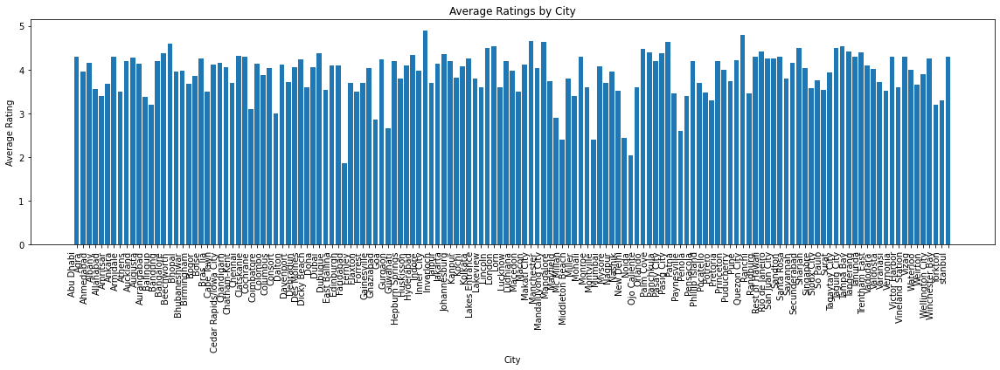

In [9]:
#Identifying patterns 
plt.figure(figsize=(16, 6))
plt.bar(average_rating_by_city['City'], average_rating_by_city['Average Rating'])
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.title('Average Ratings by City')
plt.xticks(rotation=90,ha="right")
plt.tight_layout()
plt.show()